## <center>Equirectangular Images and Gnomonic Projection</center>

 Lately in various domains, such as autonomous cars, surveillance systems,
tourism or entertainement, there is an increasing interest in spherical images, i.e. images that record 360-degree panoramas.
Spherical cameras  store the  omnidirectional images in two formats: equirectangular and cubic, but the former is most commonly used.

The equirectangular format is a flat  image of resolution $m\times 2m$, resulted by projecting the sphere parallels as rows of pixels, and meridians as columns.

Why the equirectangular images have this particular resolution? That's because this projection is based on the  unit sphere parameterization:
    $$r:[-\pi/2, \pi/2] \times [-\pi, \pi]\to \mathbb{R}^3,$$
        defined by:  $$r(\varphi, \lambda)=(x,y,z)=(\cos{\varphi}\cos{\lambda},\: \cos{\varphi}\sin{\lambda},\: \sin{\varphi}),$$
        where $\varphi\in[-\pi/2, \pi/2]$ is the latitude, and $\lambda\in[-\pi, \pi]$ is the longitude.  Since the sides of the rectangular
        region of the two parameters have  the ratio 1:2,   the sphere  can be digitized
by $m$ parallels and 2m meridians,  at equal angular distances. Then, the  projection

`(parallel, meridian) -> (row, column)`, 

sets up  the equirectangular image.


In [1]:
import skimage.io as sio
import plotly.express as px
import numpy as np
from gnomonic import * 
import plotly.io as pio
from plotly.offline import download_plotlyjs, init_notebook_mode,  iplot
init_notebook_mode(connected=True)

**Example of equirectangular image**


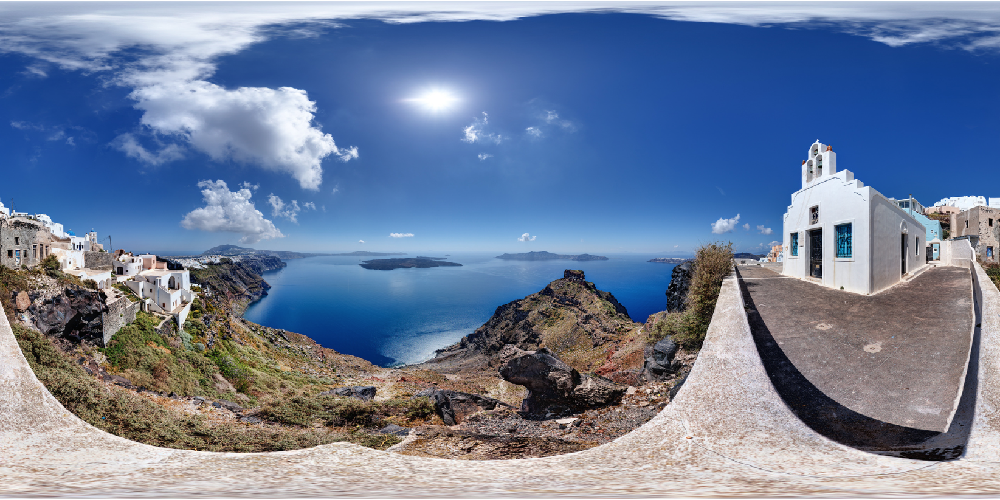

In [2]:
img = sio.imread("Images/Greece.png") 
rows, cols = img.shape[:-1]
fig1 = px.imshow(img)
iplot(fig1)

An equirectangular image is  distorted, because, by a differential geometry result, there is no isometry [https://en.wikipedia.org/wiki/Isometry](https://en.wikipedia.org/wiki/Isometry)  between a sphere and a plane, not even a local one. To get approximate normal views from an equirectangular image, different rectangular regions, of this image,  are  projected through the so called gnomonic projection.

###  Gnomonic projection

The gnomonic or rectilinear projection is a mapping from  an open semisphere to the euclidean plane. Theoretically, a fixed point on the sphere (called in the following `look_at` point),  and a field of view, `FOV`,  originating at  the sphere center are chosen. Then  by a perspective projection, with its center at the sphere center, the patch of sphere seen within the FOV is projected  onto the tangent plane at the `look_at` point.
The camera eye is looking at the `look_at` point, which is the center of the  spherical patch:  


![field of view](Images/FOV.png)

Theoretically, to get the gnomonic  projection of such of patch of sphere, we have to intersect the rays through the patch, to the tangent plane at the `look_at` point. But
if we rotate the tangent plane, with tha tangent point at the south pole, we can get the gnomonic projection
as a function, `gnom`, defined on the rectangle $[-\pi/2, \pi/2]\times[-\pi, \pi]$ of the latitude and longitude parameters,   onto a rectangular region, symmetric with respect to the origin of the euclidean plane.
  The analytical expression of this mapping, as well as of its inverse,
is given in [https://mathworld.wolfram.com/GnomonicProjection.html](https://mathworld.wolfram.com/GnomonicProjection.html).
 In *A. D. Bradley, The Gnomonic Projection of the Sphere, The American Mathematical Monthly,  Vol. 47, No. 10, pp. 694-699* are presented all computations involved in the projection derivation.

Gnomonic projection transforms arcs of   sphere big circles, passing through the `look_at` point, into line segments, but as it is illustrated at the Wolfram link, above, 
when the `look_at` point is on the equator, the  parallels  are mapped onto hyperbolas. Hence, to get an approximate normal view through
the gnomonic projection, with the `look_at` point on the equator, we have to restrict the FOV at some values (see below).


The function `gnomonic.equi2gnomonic` performs the gnomonic projection, starting from an equirectangular  image, `img`, the `look_at' point and the field of view `FOV`, given in degrees.

The image representing the gnomonic projection is defined by a geometric transformation of the equirectangular image, through the transform defined by the gnomonic map, `gnom`  (for a short description of a geometric transformations see this [Jupyter Notebook](https://nbviewer.jupyter.org/github/empet/Math/blob/master/Moebius-transform-image.ipynb).  Due to the particularities of the `gnom` map, here we use `scipy.ndimage_map_coordinates`, instead of `scipy.ndimage.geometric_tranform`. 


Fixing the `FOV=(lon_fov, lat_fov)`, with `lon_fov` $\in [-180, 180]$, `lat_fov =lon_fov/2`, and varying the `look_at` point, `look_at=(lon0, lat0)`,
  the rectangular region within the euclidean plane, defined by gnom-projecting the lon and lat in:
        
        [lon0-lon_fov, lon0+lon_fov] x [lat0-lat_fov, lat0+lat_fov]`
        
  does not depend on the `look_at` point. Hence this region, symmetric  with respect to the origin, can be defined by its upper-right corner coordinates `(xu, yu)`,
  computed as `gnom(lon0, lat0)`. As in any geometric transform of an image, we call the inverse gnomonic projection from a meshgrid over the  rectangle `[-xu, xu] x [-yu, yu]` to the equirectangular image.
The function `scipy.ndimage.map_coordinates`  interpolates the values of the channels in the gnom-projected image, from the values/nearby values at  the points derived through  the  inverse gnomonic map.

`gnomonic.py` containes all functions involved in the gnomonic projection of an equirectangular image.

Let us inspect the coordinates, `(xu, yu)`, of the uppper-right rectangle corner  corresponding to
some FOVs of the form: `(lon_fov=10*k, lat_fov=5*k)`, that defines this rectangle, as `[-xu, xu] x [-yu, yu]`: 
       

In [3]:
xu_yu = {}
for k in range(1, 10): 
    fov = (10*k, 5*k)  #degree
    lonf, latf = np.radians(fov)
    x, y = gnomonic_proj(lonf, latf)
    xu_yu[10*k]= [x, y]
xu_yu  

{10: [0.17632698070846495, 0.08883831718254097],
 20: [0.36397023426620234, 0.18764325355773737],
 30: [0.5773502691896257, 0.30940107675850304],
 40: [0.8390996311772799, 0.4751293969110776],
 50: [1.1917535925942098, 0.7254459344392113],
 60: [1.7320508075688767, 1.154700538379251],
 70: [2.747477419454621, 2.0472698812449117],
 80: [5.6712818196177075, 4.832182188440427],
 90: [1.6331239353195368e+16, 1.6331239353195368e+16]}

**Example of gnom-projected image**

In [4]:
layt = dict(xaxis_visible=False, yaxis_visible=False, 
            width=700, height=400) #common layout settings

In [ ]:
projected_img =  equi2gnomonic(img, look_at=(-65, 7), FOV=(56, 56/2))
fig2 = px.imshow(projected_img)
fig2.update_layout(**layt)
iplot(fig2)

With the cell above we can experiment any combination of `look_at` point and admissible `FOV`.

Now we generate the images resulted through the gnomonic projection of some FOVs among the FOVs listed above, to see how increasing the FOV from some `lon_fov` value, the corresponding image is more and more deformed.

In [ ]:
for k in range(12):
    flon = 25+5*k 
    projected_img =  equi2gnomonic(img, look_at=(-65, 0), FOV=(flon, flon/2))
    fign = px.imshow(projected_img)
    fign.update_layout(**layt,
                       margin=dict(t=0, r=0, b=0, l=0))
    pio.write_image(fign, f"Images/i{k}.png", width=700, height=400, scale=1)

Let us display the generated images:

In [ ]:
img_sequence = [sio.imread(f"Images/i{k}.png") for k in range(12)]
fig3 = px.imshow(np.array(img_sequence), facet_col=0, binary_string=True,
                facet_col_wrap=3,   facet_col_spacing=0, facet_row_spacing=0.)
fig3.update_layout(title_text="Gnomonic projections of diferent FOVs", title_x=0.5,
                  width=900, height=700, font_family="Serif")
fig3.update_xaxes(visible=False)
fig3.update_yaxes(visible=False)
FOVs = np.asarray([f"{(25+5*k, (25+5*k)/2)}" for k in range(12)]).reshape((4,3))
FOVs = np.flipud(FOVs).ravel()
for k, ann in enumerate(fig3.layout.annotations): 
    ann["text"] = f"FOV={FOVs[k]}"

iplot(fig3)


The last three images corresponding to large FOVs
of `lon_fov`> 65, are more and more distorted. Hence, projections with FOV, of `lon_fov at most 60`, seem to give a normal view of the cooresponding part from the equirectangular image. This particularity is more visible in the following animation:



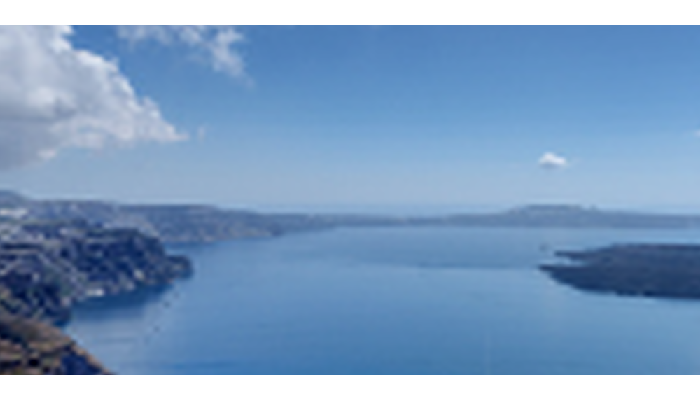
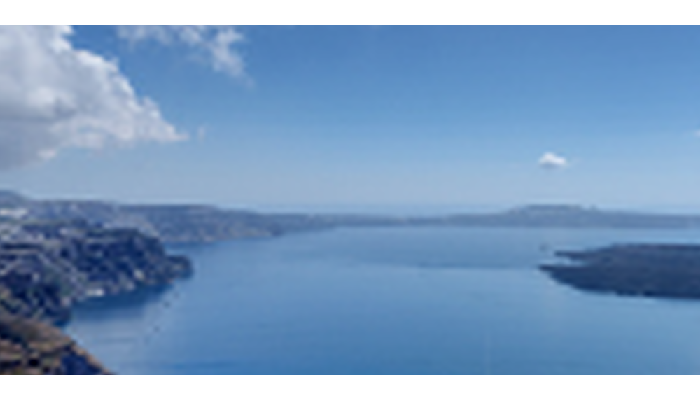
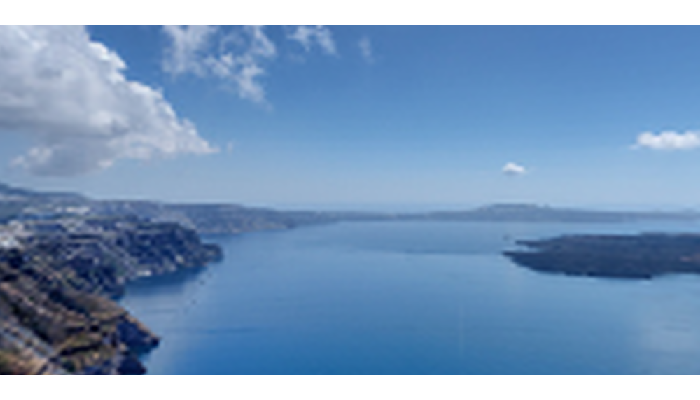
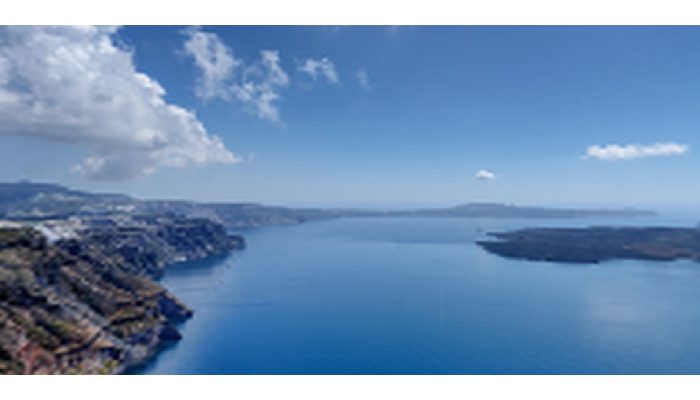
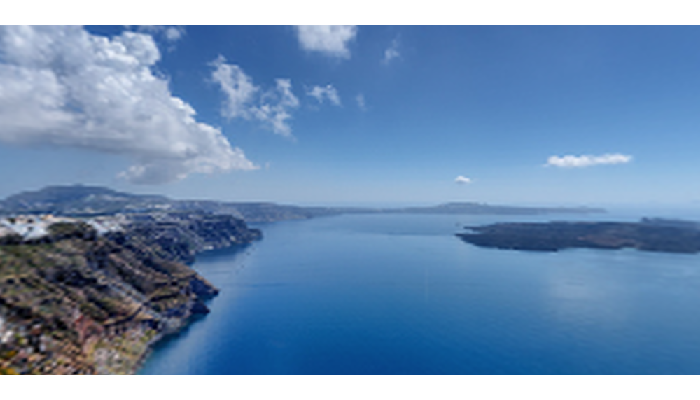
...
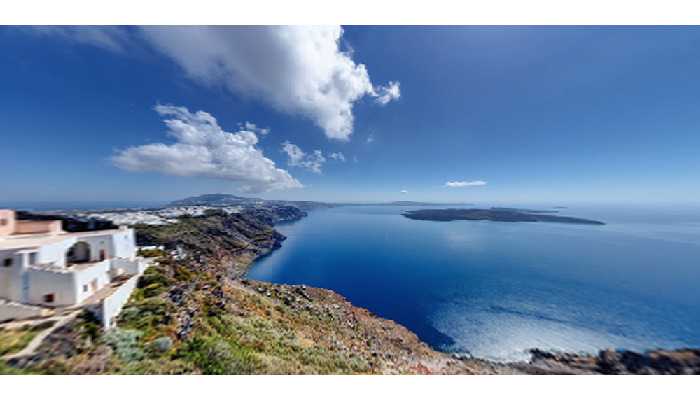
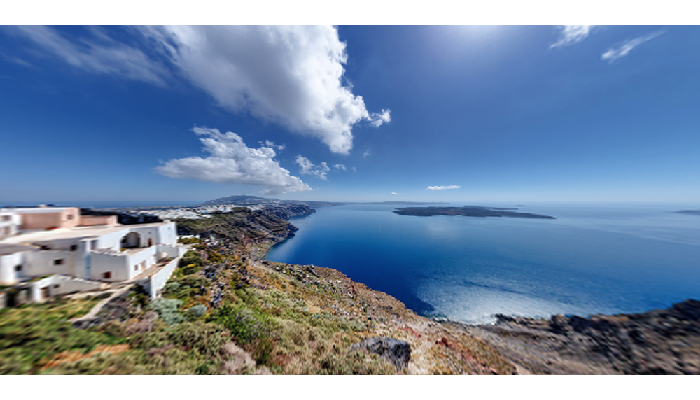
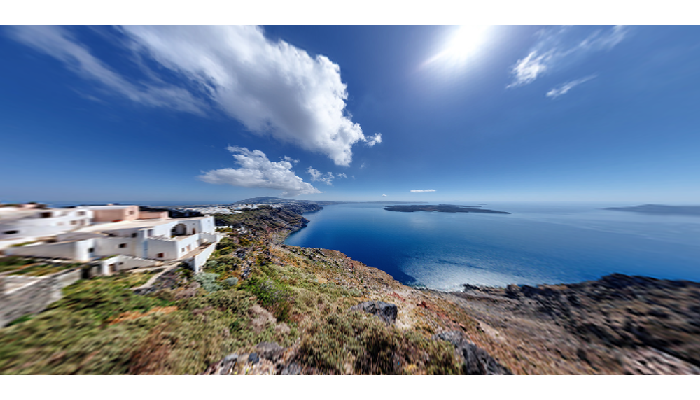
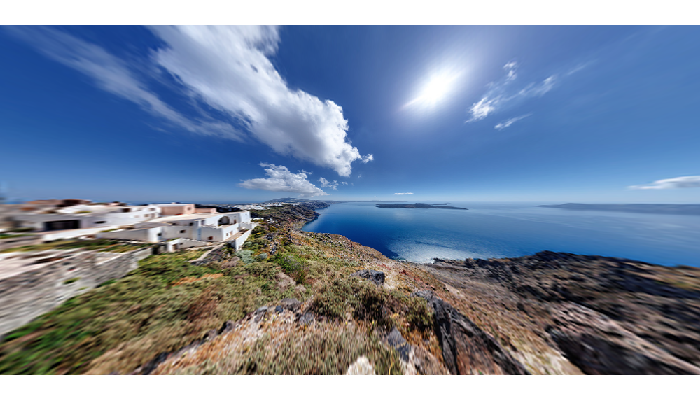
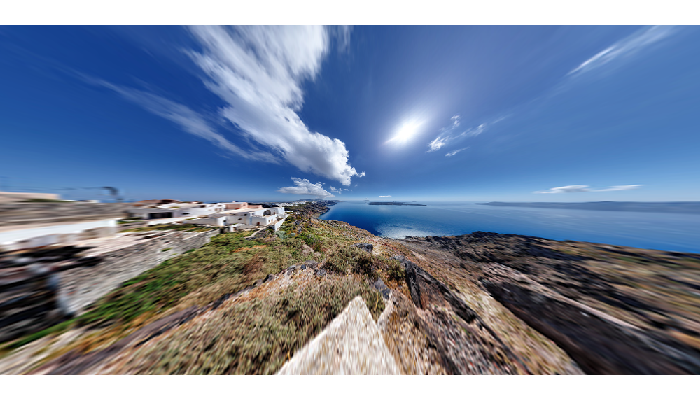

In [8]:
img_sequence = [sio.imread(f"Images/i{k}.png") for k in range(12)]
fig4 = px.imshow(np.array(img_sequence), animation_frame=0, 
                binary_string=True, labels=dict(animation_frame="FOV"))
fig4.update_layout(width=800, height=700, margin_t=20, xaxis_visible=False, yaxis_visible=False)

fig4.layout.sliders[0]['pad'].update(t=1)
fig4.layout.sliders[0].update(y=0.20, len=0.9, pad_t=1)
fig4.layout.updatemenus[0].update(y=0.18)
fig4.layout.updatemenus[0]['pad'].update( t=1)
iplot(fig4)

Moving the slider to the right a zoom-out is performed, while to the left, a zoom_in.

**Animating gnom-projected images, corresponding to a fixed FOV, and a moving `look_at` point, along the equator**


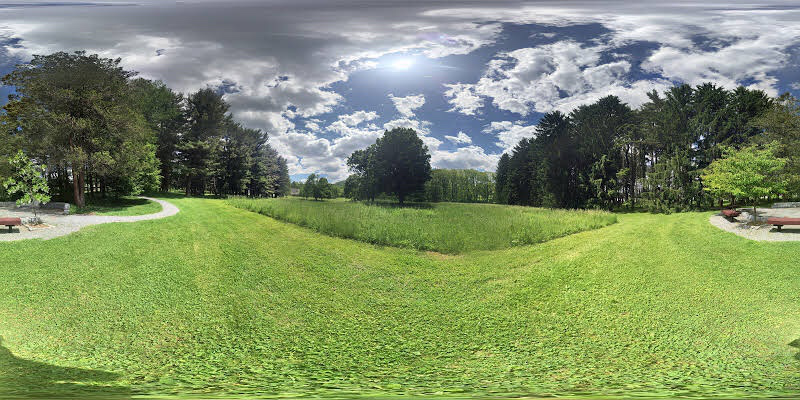

In [9]:
url= "https://raw.githubusercontent.com/empet/Datasets/master/Gnomonic-Projs/"
equi_img = sio.imread(f"{url}Nature.jpg") 
#rows, cols = equi_img.shape[:-1]
fig5 = px.imshow(equi_img)
fig5.show()

In [10]:
%%html
<img src="https://raw.githubusercontent.com/empet/Datasets/master/Gnomonic-Projs/nature.gif">